In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Flatten , Dense
from tensorflow.keras.models import Model

**Data Preparation**

In [2]:
# Load the data from the CSV file
train_dataset = pd.read_csv('/content/drive/MyDrive/PF Tasks/Car Plate Detection/Dataset/Dataset/train_labels.csv')

# Define the List for Images and Targets
images = []
targets = []

# Define the Path of the Images
base_path_images = "/content/drive/MyDrive/PF Tasks/Car Plate Detection"

count = 0
# Extract the Images by Iterating
for filename in train_dataset["filename"]:
    # Extract the Image Path
    image_path = os.path.join(base_path_images, filename)

    # Read the Image
    image = Image.open(image_path)

    # Extract the Image Width and Height
    w , h = image.size

    # Get the X,Y,Width,Height
    x = float(train_dataset["xmin"][count]) / w
    y = float(train_dataset["ymin"][count]) / h
    width  = float(train_dataset["xmax"][count]) / w
    height = float(train_dataset["ymax"][count]) / h

    # Reshape the Image
    reshape_image = image.resize((224,224))

    # Append the Images and Targets
    images.append(np.array(reshape_image))
    targets.append((x, y, width, height))

    count += 1


In [6]:
print(f"Shape of the Images is : {np.shape(images)}")
print(f"Shape of the Target is : {np.shape(targets)}")

Shape of the Images is : (225, 224, 224, 3)
Shape of the Target is : (225, 4)


**Model Customization**

In [13]:
# Convert the images and targets in the Numpy Matrix
Images = np.array(images , dtype = "float32") / 255.0
Targets = np.array(targets , dtype = "float32")

# Split the data into training and validation sets
train_images, val_images, train_targets, val_targets = train_test_split(Images, Targets, test_size=0.2, random_state=42)

# Load the pre-trained model
base_model = VGG16(input_shape=(224, 224, 3), include_top=False)

# Freeze the layers of the base model
base_model.trainable = False

# Now Flatten The VGG16 Model Outpust
flatten = Flatten()(base_model.output)

# Now Applying the Fully Connected Layers
x = Dense(256 , activation = "relu")(flatten)
x = Dense(128 , activation = "relu")(x)
x = Dense(64  , activation = "relu")(x)
x = Dense(32  , activation = "relu")(x)
bbox = Dense(4)(x)


**Training**

In [14]:

# Create the FinalModels
model = Model(inputs = base_model.input , outputs = bbox)

# Now Compile the Final Model
model.compile(loss = "mse" , optimizer = "adam")

# Train the model
model.fit(train_images, train_targets, batch_size=32, epochs=4, validation_data=(val_images, val_targets))

Epoch 1/4
6/6 [==============================] - 163s 28s/step - loss: 1.8491 - val_loss: 0.1079
Epoch 2/4
6/6 [==============================] - 156s 27s/step - loss: 0.1027 - val_loss: 0.1025
Epoch 3/4
6/6 [==============================] - 159s 27s/step - loss: 0.0750 - val_loss: 0.0502
Epoch 4/4
6/6 [==============================] - 155s 27s/step - loss: 0.0453 - val_loss: 0.0525


**Evaluation**

In [15]:
# Evaluate the model on the validation set
loss = model.evaluate(val_images, val_targets)
print("Validation Loss:", loss)

2/2 [==============================] - 29s 10s/step - loss: 0.0525
Validation Loss: 0.05245724320411682


**Testing**

1/1 [==============================] - 1s 1s/step


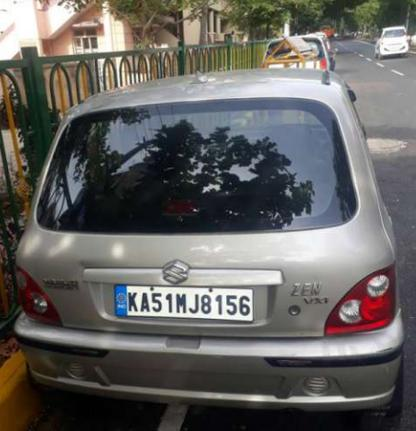

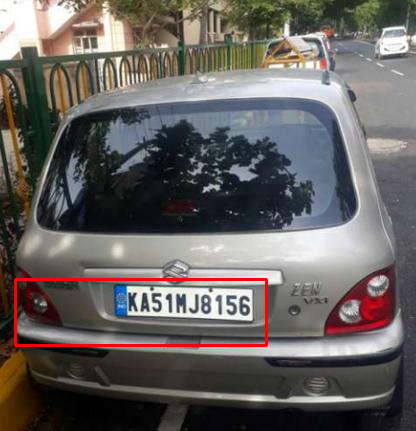

1/1 [==============================] - 1s 996ms/step


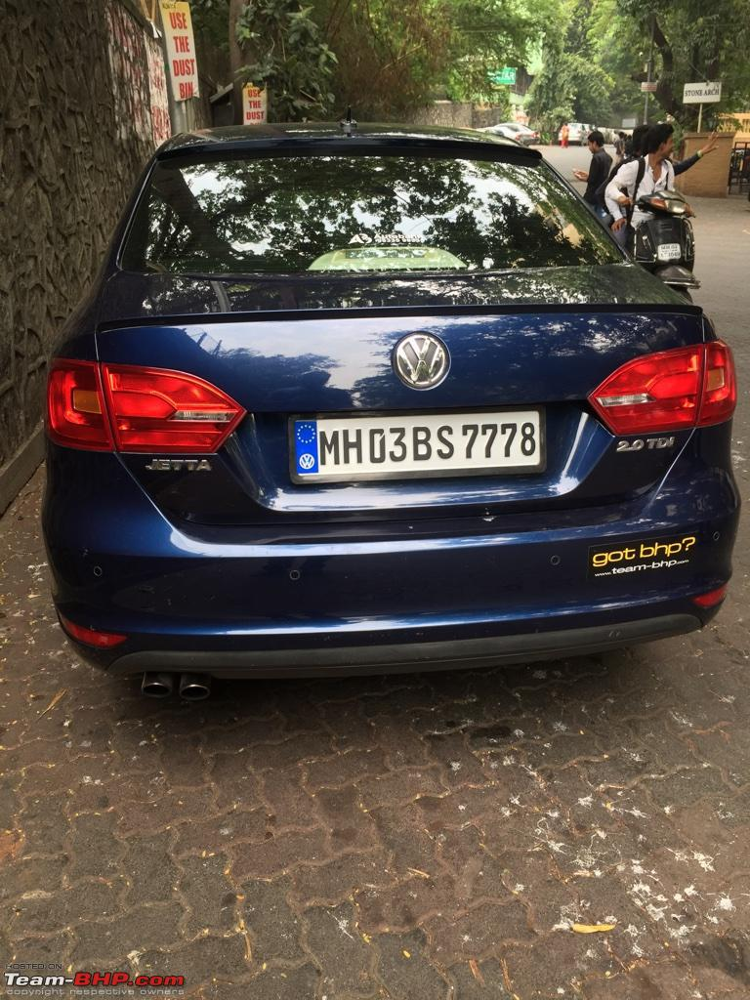

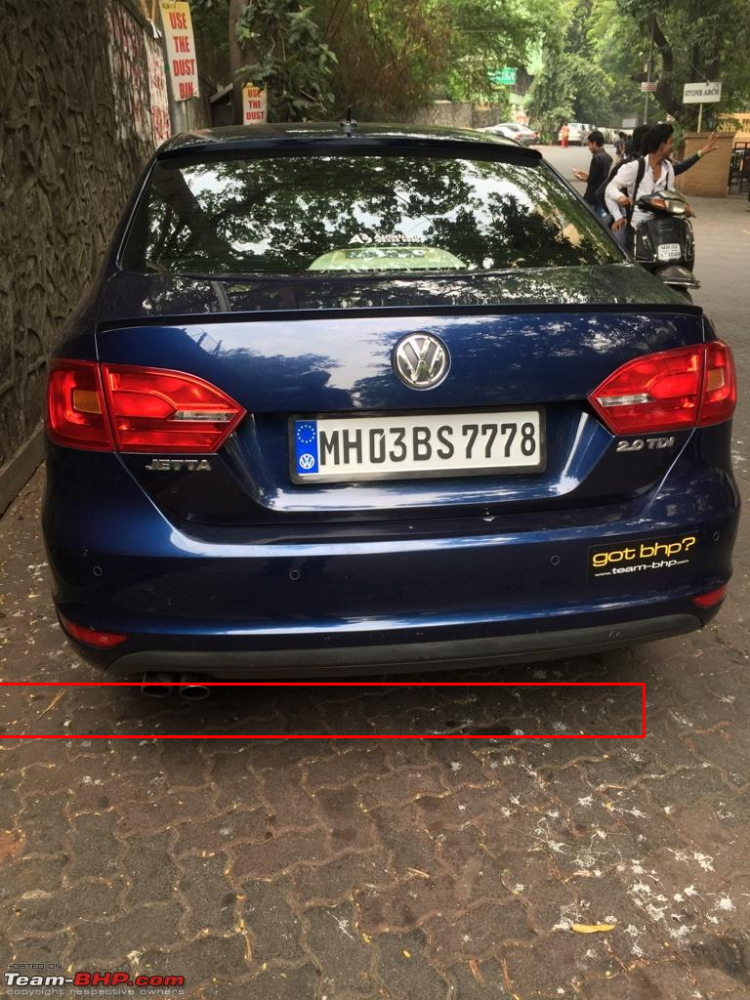

1/1 [==============================] - 1s 1s/step


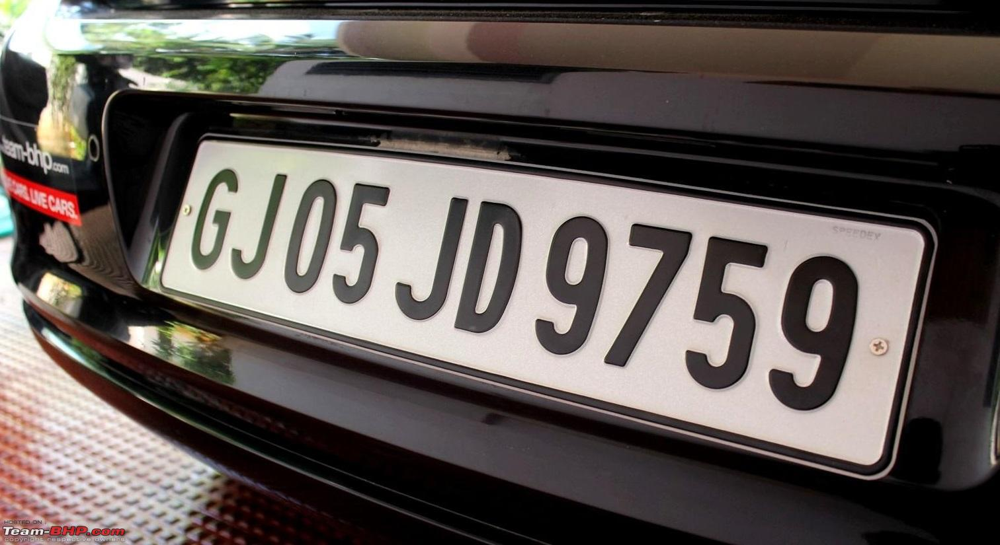

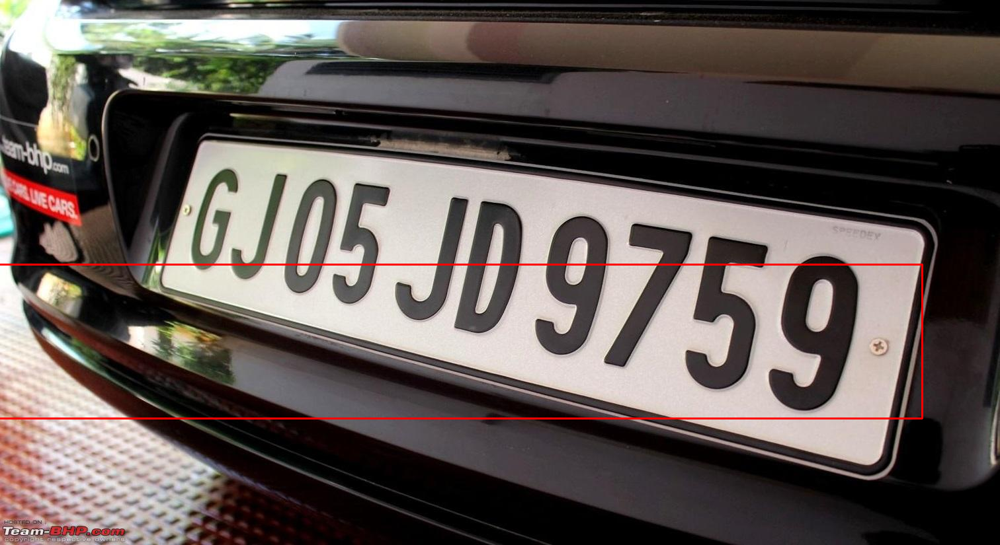

1/1 [==============================] - 1s 713ms/step


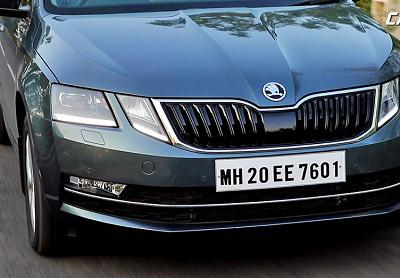

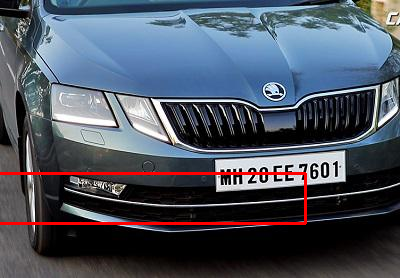

1/1 [==============================] - 1s 746ms/step


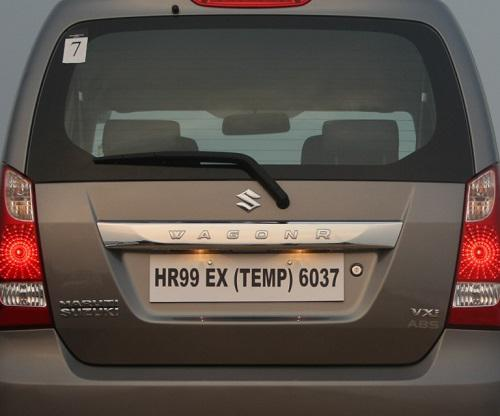

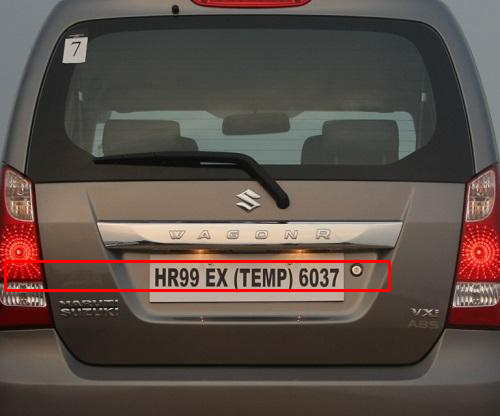

1/1 [==============================] - 1s 561ms/step


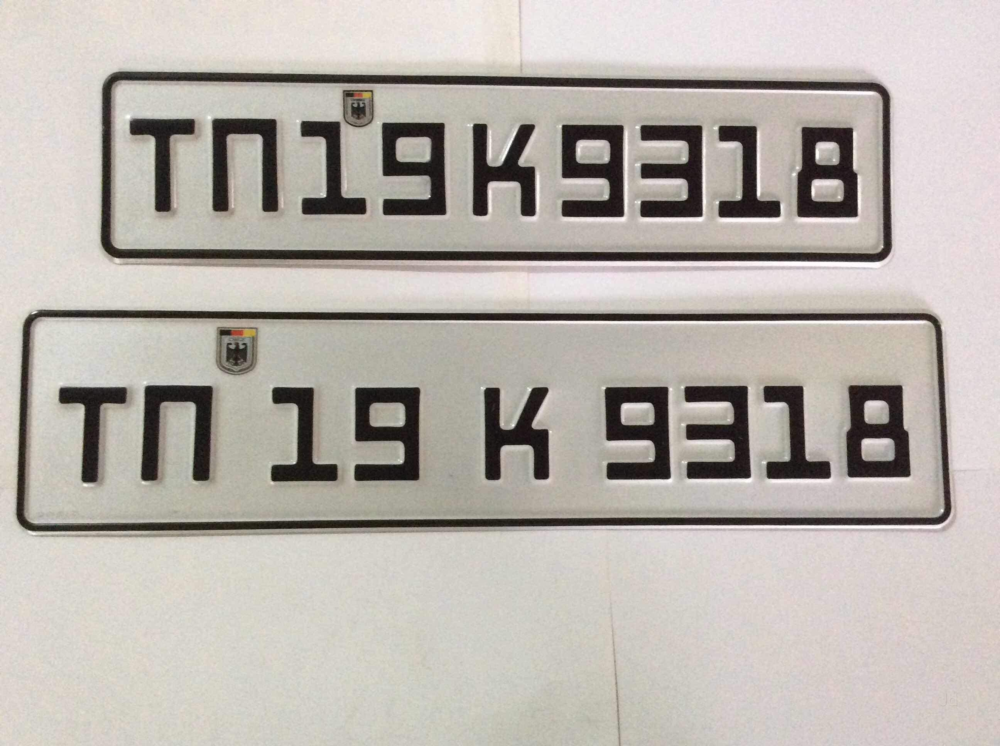

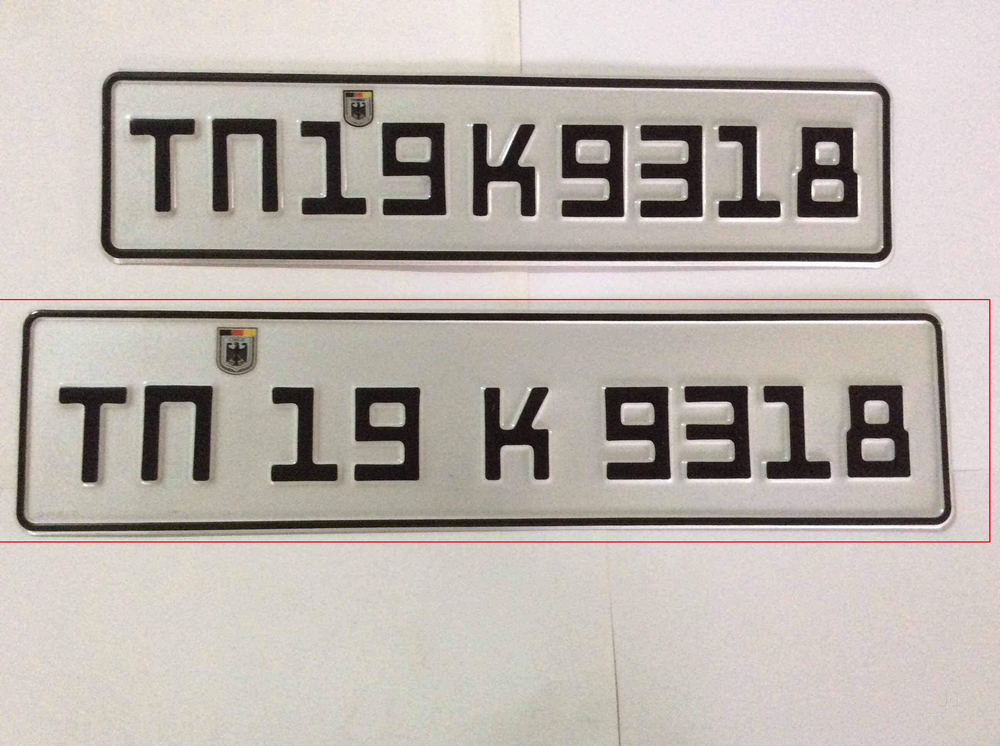

1/1 [==============================] - 1s 952ms/step


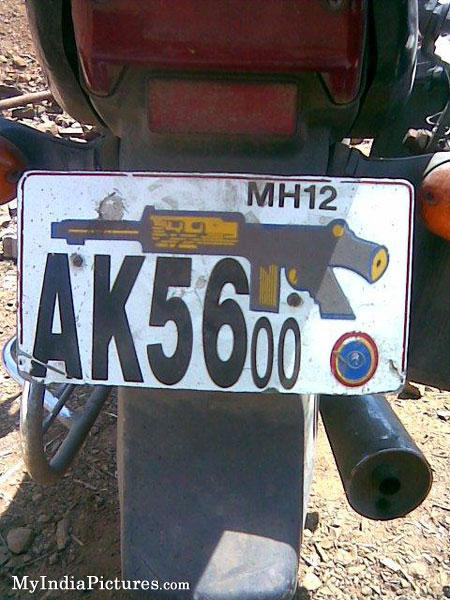

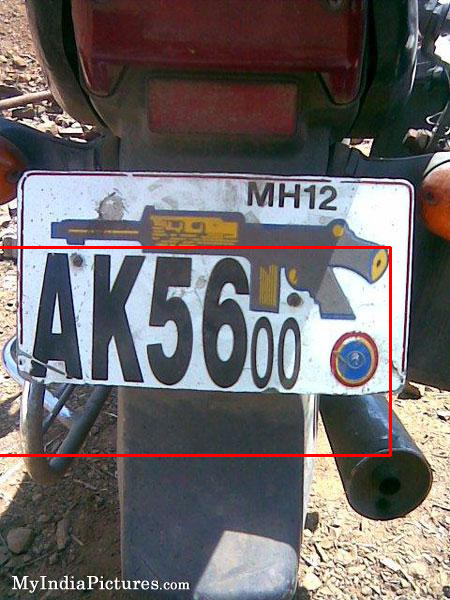

1/1 [==============================] - 1s 937ms/step


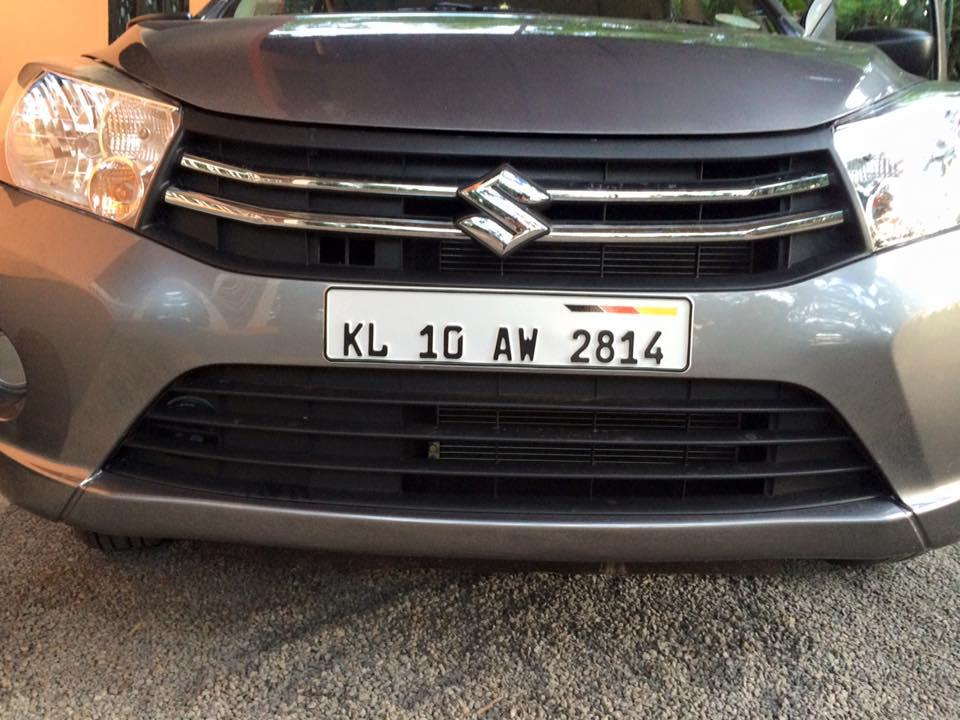

In [ ]:
# Define the Testing Dataset
test_dataset_path = "/content/drive/MyDrive/PF Tasks/Car Plate Detection/Dataset/Dataset/test_labels.csv"

# Read the Test CSV File
test_dataset = pd.read_csv(test_dataset_path)
for filename in test_dataset["filename"]:
    # Get the Image Path
    image_path = os.path.join(base_path_images, filename)

    # Read the Image
    image = Image.open(image_path)

    # Extract the Size of Image
    w,h = image.size

    # Resize the Image
    resize_image = image.resize((224,224))

    # Convert the Numpy Array Image
    cv2_image = np.array(resize_image)

    # Rescale the Image
    cv2_image = cv2_image / 255.0

    # Predict the Image
    finalImage = np.expand_dims(cv2_image,axis=0)
    prediction = model.predict(finalImage)[0]

    # Now get the X,Y,Width and Height
    x = int(prediction[0] * w)
    y = int(prediction[1] * h)
    width = int(prediction[2] * w)
    height = int(prediction[3] * h)

    # Again Create Numpy Array
    cv2_image_2 = np.array(image)
    cv2.rectangle(cv2_image_2 , (x,y) , (width , height) , (255,0,0) , 2)

    # Display the Image
    display(image)
    display(Image.fromarray(cv2_image_2))